# Notebook 1 : entrainement d'un modèle de segmentation, et application aux données

Nous travaillons sur un annuaire de propriétaire, plus précisément le volume de l'année 1951-52 des "Annuaire des propriétaires et des propriétés de Paris et du département de la Seine" (lien de la notice dans le catalogue de la BNF : https://catalogue.bnf.fr/ark:/12148/cb32697229h).

Cet annuaire associe à chaque personne 1/ l'adresse de son domicile, et 2/ les adresses du ou des immeubles que cette personne possède. Nous nous intéressons à cet annuaire dans le cadre d'une étude sur la propriété à Paris.

Ce travail a déjà effectué pour d'autres années, en particulier 1898 : https://nakala.fr/collection/10.34847/nkl.f1d5052t. Ce travail sur l'année 1951 a été effectué par Aaron Parmentelat, dans le cadre de son mémoire du master "Humanités Numériques", à l'Ecole des Chartes. Pour la version finale du mémoire, et les codes, voir : https://github.com/parm-a/memoire_M2/tree/main.

<br>

Nous avons une version numérique (images des pages), et nous voulons extraire les informations contenues dans cette source, et les organiser sous forme de tableau. Ce tableau aura comme colonnes : le nom du propriétaire, son adresse, le nombre d'immeubles possédés, les adresses de ces immeubles, etc.

Cette extraction se découpe en plusieurs étapes :
- segmentation des pages (fine-tuning du modèle YOLO segmentation v8 d'Ultralytics) > **Notebook 1** : `1_application_YOLO.ipynb`
- extraction du texte contenu dans les pages (utilisation de PERO-OCR) > **Notebook 2 et fichier pipeline.py** : `2_PERO_OCR.ipynb`
- classement du texte en plusieurs catégories (nom du propriétaire, adresse, etc.), géocodage des adresses, et production de tableaux CSV > **Notebook 3** : `3_NER.ipynb`
- analyse de ces données par la production de cartes et statistiques > **Notebook 4** : `4_analyses.ipynb`

<br>

***

<br>

Ce notebook est dédié à la première étape : la segmentation des pages. Nous avons des pages d'annuaires de propriétaires en format PNG, et notre objectif et de les découper afin d'extraire les images des trois colonnes séparemment. Un modèle de segmentation permet de découper une image en plusieurs zones ; nous allons donc en utiliser un pour extraire les images des trois colonnes.

Pour ce faire, nous allons nous servir des outils développés par Ultralytics. Nous téléchargeons leur modèle de segmentation YOLO v8 (voir https://docs.ultralytics.com/tasks/segment/#models), et nous allons le fine-tuner avec un échantillon annoté de 75 pages de nos données. Le modèle de segmentation YOLO v8 est déjà téléchargé et se trouve dans : `/0_donnees_rangees/modeles_1951/1_YOLO/yolov8m-seg.pt`

L'échantillon de 75 pages de nos données a été créé avec Roboflow (https://roboflow.com/annotate) et ces données d'entrainement structurées se trouvent dans le dossier : `/0_donnees_rangees/donnees_entrainement_1951/donnees_anotees_roboflow_segmentation/`

Ce notebook prend en input des images en PNG, et produit des crops de ces images en format JPG.

<br>

***

<br>


Nous nous servons d'un environnement avec :
- python version 3.10.14
- ultralytics version 8.0.196
- opencv-python version 4.6.0.66
- (plus?)

In [1]:
# import des librairies
from ultralytics import YOLO
import os
import cv2

from IPython.display import Image, display

/home/aaron/anaconda3/envs/ultral_3/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [4]:
# On définit les paths, par rapport à l'arborescence existante, en commencant par le dossier parent ou se trouvent toutes les ressources
parent_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
print(parent_dir)

# Paths des données d'entrainement et du modèle YOLO v8
path_data = os.path.join(parent_dir, 'donnees_entrainement_1951/donnees_anotees_roboflow_segmentation')
path_modele = os.path.join(parent_dir, 'modeles_1951/1_YOLO/yolov8m-seg.pt')
print(path_data)
print(path_modele)

/home/aaron/Documents/M2/memoire_M2/0_donnees_rangees
/home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/donnees_entrainement_1951/donnees_anotees_roboflow_segmentation
/home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/modeles_1951/1_YOLO/yolov8m-seg.pt


On va aussi entrer le path du dossier qu'on veut traiter. Ici, on va utiliser "sample", qui contient 10 pages aléatoires de la liste des propriétaires (format "d-001.png"), et 5 pages aléatoires de la liste des rues (format "b-001.png"). On pourrait remplacer ce path par un autre dossier contenant des images à découper.

In [5]:
path_folder = os.path.join(parent_dir, 'sample_1951/pages_entieres_png')
print(path_folder)

/home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/pages_entieres_png


# Etape 1 : Entrainement du modèle (fine-tuning)

Nous allons dans un premier temps charger le modèle de base (YOLO segmentation v8), et le re-entrainer sur notre jeux de données, pour obtenir un nouveau modèle de segmentation le plus adapté possible à nos données.

In [5]:
# Chargement du modèle de segmentation YOLO v8
modele = YOLO(path_modele)

In [6]:
# Entrainement
resultats = modele.train(data=os.path.join(path_data, "data.yaml"), epochs=100, imgsz=640)

New https://pypi.org/project/ultralytics/8.2.82 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.14 torch-2.3.0+cu121 CPU (Intel Core(TM) i7-8665U 1.90GHz)
engine/trainer: task=segment, mode=train, model=/home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/modeles_1951/1_YOLO/yolov8m-seg.pt, data=/home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/donnees_entrainement_1951/donnees_anotees_roboflow_segmentation/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, sourc

# Etape 2 : Application du modèle

Nous allons maintenant appliquer le modèle à nos données. Nous allons l'appliquer à un échantillon de 15 pages, qui contient 10 pages de la liste ordonnée par propriétaires, et 5 pages de la liste ordonnée par rue.

In [6]:
# Import du modèle fine-tuné qu'on a entrainé plus haut.
# Note : il se trouve initialement dans le dossier "/0_donnees_rangees/notebooks_1951/runs/segment/train/"
path_modele_final = os.path.join(parent_dir, 'modeles_1951/1_YOLO/best.pt')
modele_final = YOLO(model=path_modele_final, task='segment')

In [13]:
for file in sorted(os.listdir(path_folder)):
    if file.endswith('.png'):
        path_image = os.path.join(path_folder, file)
        result_image = modele_final(source=path_image, save_crop=True)


image 1/1 /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/pages_entieres_png/b-083.png: 640x480 1 col_1, 1 col_2, 1 col_3, 125.1ms
Speed: 2.8ms preprocess, 125.1ms inference, 8.3ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/segment/predict6

image 1/1 /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/pages_entieres_png/b-212.png: 640x480 1 col_1, 1 col_2, 1 col_3, 104.0ms
Speed: 4.0ms preprocess, 104.0ms inference, 5.5ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/segment/predict6

image 1/1 /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/pages_entieres_png/b-477.png: 640x480 1 col_1, 1 col_2, 1 col_3, 104.9ms
Speed: 2.9ms preprocess, 104.9ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs/segment/predict6

image 1/1 /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/pages_entieres_png/b-515.png: 640x480 1 col_1, 1 col_2, 1 col_

Les résultats se stockent dans le dossier **/0_donnees_rangees/notebooks_1951/runs/segment/predict/crops/**.

# Etape 3 : déplacement et changement du nom des images obtenues pour plus de lisibilité

Ce dossier "crops" contient 3 dossiers correspondant aux 3 classes de notre modèle, correspondant aux trois colonnes. Dans chaque dossier se trouve les crops effectués par le modèle.

Nous batch-renommons tous le fichiers pour rajouter la classe (numero de la colonne) a la fin de leur nom, et nous les rangeons dans un dossier unique. Ainsi, le fichier `/0_donnees_rangees/notebooks_1951/runs/segment/predict/crops/col_1/b-083.jpg` devient `/0_donnees_rangees/sample_1951/crops_colonnes_jpg/b-083_col1.jpg`, et nous pouvons avoir toutes les images de sorties (colonnes découpées) dans le meme dossier.

In [16]:
# On va déplacer et renommer les images de sorties

# On définit le path ou se trouvent originellement les crops
# Note : "predict" peut etre en réalité predict6, ou un autre nombre, si des plusieurs opérations de cette nature ont été lancées dans le meme dossier
crops_dir = os.path.join(parent_dir, "notebooks_1951/runs/segment/predict/crops/")

# Puis le path du dossier ou on veut déplacer ces crops, et on créé ce nouveau dossier
goal_dir = os.path.join(parent_dir, "sample_1951/", "crops_colonnes_jpg")
os.mkdir(goal_dir)

# Maintenant, on va chercher les fichiers ou ils existent, et on va les renommer pour rajouter le numéro de la colonne dans leur nom, et
# les déplacer pour les mettre dans le bon dossier
for col_number in range(1, 4):
    class_dir = os.path.join(crops_dir, f"col_{col_number}")
    for file in sorted(os.listdir(class_dir)):
        filename, file_extension = os.path.splitext(file)
        old_path = os.path.join(class_dir, file)
        new_name = filename + f"_col{col_number}" + file_extension
        new_path = os.path.join(goal_dir, new_name)
        os.rename(old_path, new_path)
        print(f"Déplacement du fichier {old_path}\nvers la destination {new_path}\n")

Déplacement du fichier /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/notebooks_1951/runs/segment/predict6/crops/col_1/b-083.jpg
vers la destination /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/crops_colonnes_jpg/b-083_col1.jpg

Déplacement du fichier /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/notebooks_1951/runs/segment/predict6/crops/col_1/b-212.jpg
vers la destination /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/crops_colonnes_jpg/b-212_col1.jpg

Déplacement du fichier /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/notebooks_1951/runs/segment/predict6/crops/col_1/b-477.jpg
vers la destination /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/crops_colonnes_jpg/b-477_col1.jpg

Déplacement du fichier /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/notebooks_1951/runs/segment/predict6/crops/col_1/b-515.jpg
vers la destination /home/aaron/Documents/M2/memoire_M2/0_donnees_rangees/sample_1951/crops_c

**Note** : si le modèle détecte plusieurs col_1 sur l'image `d-018.jpg`, il va sauvegarder la première sous le nom `d-018.jpg`, puis les suivantes sous les noms `d-0182.jpg`, `d-0183.jpg`, etc. Et dans les cas ou il existe de multiples versions, j'ai vérifié à la main laquelle étaient la meilleure. Il est particulierement intéressant de verifier manuellement les pages qui sont scindées en deux par un changement de lettre.

# Etape 4 : résultat de ce notebook
nous avons comme image de base :


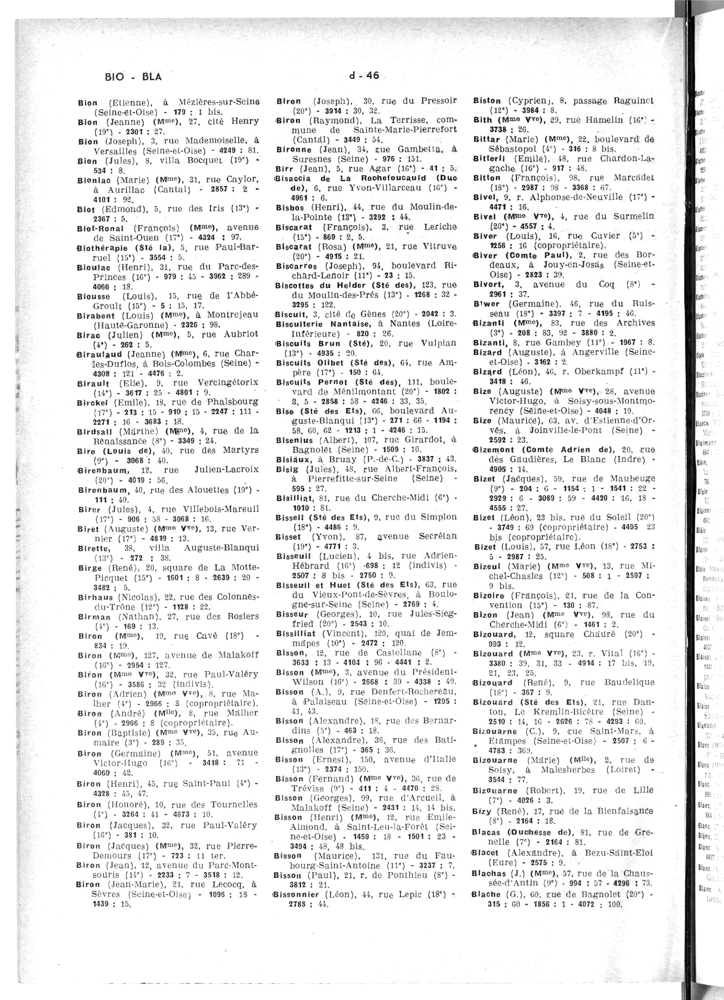

In [8]:
img_path = os.path.join(parent_dir, 'sample_1951/pages_entieres_png/d-046.png')
niveau_zoom = 300   # à ajuster si besoin
display(Image(filename=img_path, width=niveau_zoom))

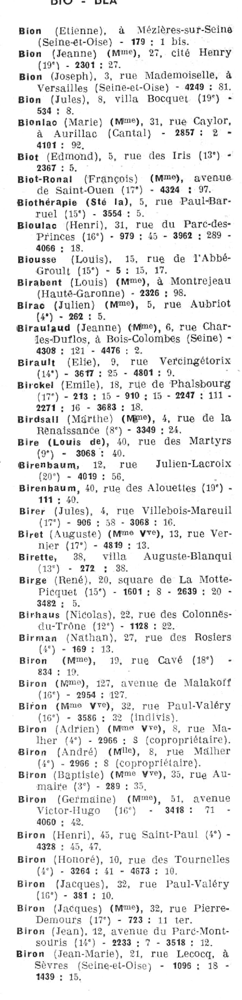

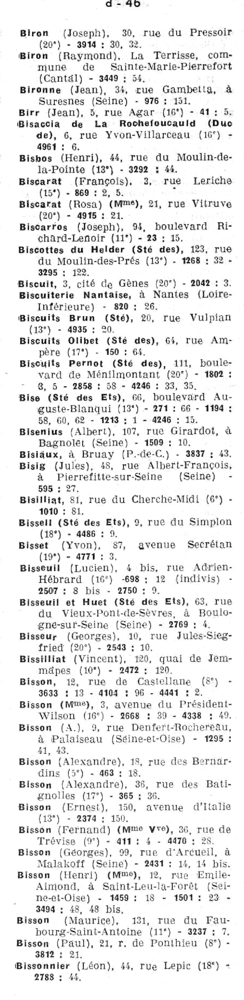

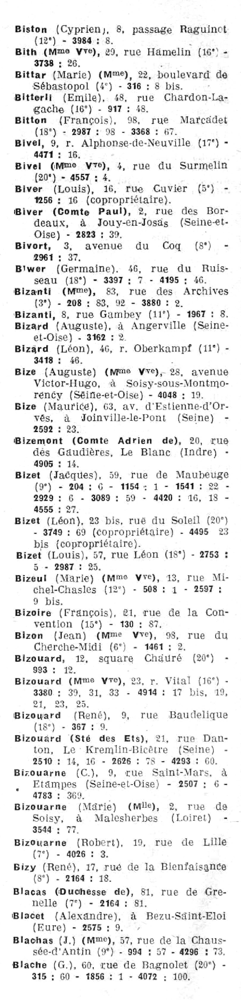

In [9]:
# Et nous obtenons comme crops :
list_crops = [os.path.join(parent_dir, f"sample_1951/crops_colonnes_jpg/d-046_col{i}.jpg") for i in range(1,4)]
niveau_zoom = 75   # à ajuster si besoin
for path in list_crops:
    display(Image(filename=path, width=niveau_zoom))